In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
from jax import vmap, jit
import jax.numpy as jnp
from pathlib import Path
import numpy as np
from einops import rearrange
import jax
import matplotlib.pyplot as plt
import seaborn as sns
from hflow.misc.plot import scatter_movie, imshow_movie, line_movie
from hflow.run import build
from hflow.io.load import load_single, load_multi
import random

In [ ]:
cfgs, df = load_multi('sburgers', '171259246116')

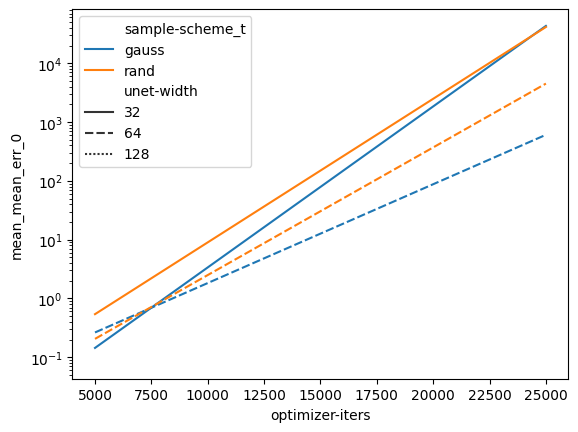

In [19]:
ax = sns.lineplot(data=df,x='optimizer-iters', y='mean_mean_err_0', hue='sample-scheme_t', style='unet-width')
ax.set(yscale="log")
plt.show()

In [39]:
cfg, row = load_single('sburgers', 'recent')
key, data, loss_fn, arg_fn, s_fn, params_init = build(cfg)
# opt_params = df['opt_params']

loading results/sburgers/single/171259210096


In [9]:
row = df[df['mean_mean_err_0'] == df['mean_mean_err_0'].min()].iloc[0]

In [10]:
test_sol = row['test_sol_0']
true_sol = row['true_sol_0']
true_sol = rearrange(true_sol, 'T N D -> N T D')
test_sol = rearrange(test_sol, 'T N D -> N T D')

In [11]:
line_movie(true_sol)

In [12]:
line_movie(test_sol)

In [16]:
test_sol = row['test_sol_0']
true_sol = row['true_sol_0']
line_movie([np.mean(true_sol,axis=1), np.mean(test_sol,axis=1)])

In [ ]:
from hflow.train.test import solve_test

In [76]:
from hflow.misc.misc import pts_array_from_space
def get_kde(frame, nx=75):
    kernel = jax.scipy.stats.gaussian_kde(frame.T)
    a,b = jnp.linspace(0,1,nx),jnp.linspace(0,1,nx)
    X = pts_array_from_space([a,b])
    return kernel(X.T).reshape(nx, nx)

get_kde = vmap(jit(get_kde))

In [77]:
def get_hist(frame, nx=128):
    frame = frame.T
    H, x, y = jnp.histogram2d(frame[0], frame[1], bins=64, range=[[0,1],[0,1]])
    return H

get_hist = vmap(jit(get_hist))

In [78]:
idx = np.linspace(0, len(true_sol)-1, 50, dtype=np.int32)
kde_sol = get_hist(true_sol[idx])
imshow_movie(kde_sol)

In [79]:
idx = np.linspace(0, len(test_sol)-1, 50, dtype=np.int32)
kde_sol = get_hist(test_sol[idx])
imshow_movie(kde_sol)